In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import libraries

In [ ]:
import os
import shutil
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from glob import glob
import torch
import torch.nn as nn
from torchvision import models
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import models
from torchvision import transforms
from torch.utils.data import TensorDataset, DataLoader
from pathlib import Path
from tensorflow.keras.preprocessing.image import load_img ,img_to_array
# Data
from glob import glob
from tqdm import tqdm
import tensorflow.image as tfi
import tensorflow as tf
from tensorflow.keras.utils import load_img, img_to_array

# Spilting Dataset to input images and segmentation masks


In [ ]:
#the  path to our directory
directory_path = Path(r'/content/drive/MyDrive/archive (1)')

In [ ]:
# Use the glob method to get a list of files matching the pattern
original_image = directory_path.glob('*.jpg')
image=[]
# Iterate over the files
for file in sorted(original_image):
    image.append(file)
    print(file)

/content/drive/MyDrive/archive (1)/Frame 1  (1).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (10).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (100).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (11).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (12).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (13).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (14).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (15).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (16).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (17).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (18).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (19).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (2).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (20).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (21).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (22).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (23).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (24).jpg
/content/drive/MyDrive/archive (1)/Frame 1  (25

In [ ]:
# Use the glob method to get a list of files matching the pattern
mask_image = directory_path.glob('*___fuse.png')
mask=[]
# Iterate over the files
for file in sorted(mask_image):
    mask.append(file)
    print(file)

/content/drive/MyDrive/archive (1)/Frame 1  (1).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (10).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (100).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (11).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (12).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (13).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (14).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (15).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (16).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (17).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (18).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (19).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (2).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (20).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 1  (21).jpg___fuse.png
/content/drive/MyDrive/archive (1)/Frame 

In [ ]:
mask[0]

PosixPath('/content/drive/MyDrive/archive (1)/Frame 1  (1).jpg___fuse.png')

In [ ]:
image[0]

PosixPath('/content/drive/MyDrive/archive (1)/Frame 1  (1).jpg')

load

# Visualizing Data Before Data Preprocessing


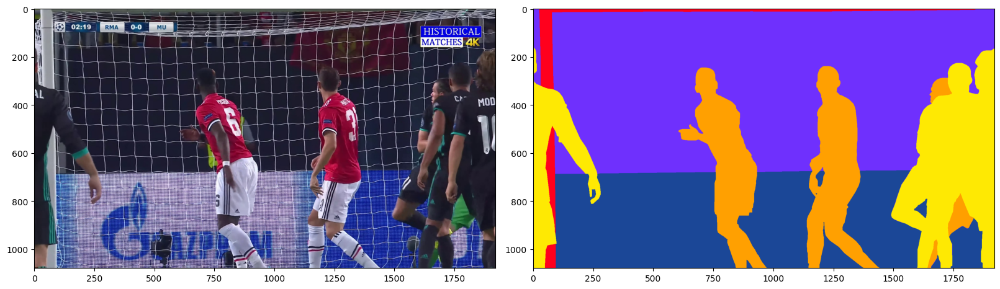

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

original_image =image[0]
label_image_semantic = mask[0]

fig, axs = plt.subplots(1, 2, figsize=(16, 8), constrained_layout=True)

axs[0].imshow( Image.open(original_image))
axs[0].grid(False)

label_image_semantic = Image.open(label_image_semantic)
label_image_semantic = np.asarray(label_image_semantic)
axs[1].imshow(label_image_semantic)
axs[1].grid(False)

# load original imagesand masks

 ## ALSO Resize or crop images and masks to a consistent size while loading it

In [ ]:
def load_image(path, size=(256, 256)):
    image = Image.open(path).convert("RGB").resize(size)
    image = img_to_array(image)
    image = tf.cast(image, tf.float32)
    return image

In [ ]:
def load_data(image_paths, label_paths, SIZE=256):
    images, label_maps = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3)), np.zeros(shape=(len(label_paths), SIZE, SIZE, 3))
    for i, (image_path, label_path) in tqdm(enumerate(zip(image_paths, label_paths)), desc="Loading"):
        image, label_map = load_image(image_path), load_image(label_path)
        images[i], label_maps[i] = image, label_map
    return images, label_maps

In [ ]:
images, label_maps = load_data(image, mask)

Loading: 102it [00:25,  4.00it/s]


In [ ]:
print(images)

[[[[ 99. 108.  71.]
   [ 99. 109.  65.]
   [ 92. 102.  65.]
   ...
   [ 55.  58.  65.]
   [ 75.  79.  81.]
   [125. 131. 131.]]

  [[ 96. 101. 103.]
   [ 95. 101.  95.]
   [ 89.  94.  96.]
   ...
   [105. 107. 118.]
   [123. 126. 135.]
   [113. 118. 125.]]

  [[ 83.  86.  99.]
   [ 82.  86.  99.]
   [ 78.  82.  94.]
   ...
   [102. 104. 117.]
   [127. 130. 141.]
   [ 87.  90. 100.]]

  ...

  [[149. 109. 101.]
   [140. 100.  92.]
   [138. 100.  91.]
   ...
   [ 44.  42.  55.]
   [ 39.  37.  50.]
   [ 38.  36.  49.]]

  [[150. 109. 101.]
   [137.  99.  91.]
   [119. 107.  94.]
   ...
   [ 42.  46.  57.]
   [ 37.  42.  52.]
   [ 38.  36.  49.]]

  [[101.  64.  55.]
   [ 86.  54.  43.]
   [ 86. 102.  87.]
   ...
   [ 48.  60.  68.]
   [ 39.  49.  58.]
   [ 36.  36.  48.]]]


 [[[ 15.  17.  32.]
   [ 14.  15.  30.]
   [ 46.  46.  67.]
   ...
   [ 10.  36.  58.]
   [ 11.  36.  60.]
   [ 13.  41.  68.]]

  [[ 15.  17.  32.]
   [ 14.  16.  31.]
   [ 50.  52.  73.]
   ...
   [ 18.  35.  57.]
 

# Step 1: Split the dataset into training and validation sets

In [ ]:

# Assuming you have loaded the images and masks into 'images' and 'masks' numpy arrays
train_images, val_images, train_masks, val_masks = train_test_split(
    images, label_maps, test_size=0.2, random_state=42
)


## Step 3: Normalize pixel values of images to a standard range [0, 1]

In [ ]:
# Normalize pixel values of images to a standard range [0, 1]
train_images = np.array(train_images) / 255.0
val_images = np.array(val_images) / 255.0
train_masks = np.array(train_masks) / 255.0
val_masks = np.array(val_masks) / 255.0

In [ ]:
# Verify the shapes of the data
print("Train Images Shape:", train_images.shape)
print("Train Masks Shape:", train_masks.shape)
print("Validation Images Shape:", val_images.shape)
print("Validation Masks Shape:", val_masks.shape)

Train Images Shape: (81, 256, 256, 3)
Train Masks Shape: (81, 256, 256, 3)
Validation Images Shape: (21, 256, 256, 3)
Validation Masks Shape: (21, 256, 256, 3)


# Visualizing Images Before and Aftter Data Preprocessing

### 1.1 Before  Data Preprocessing

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

original_image =image[0]
label_image_semantic = mask[0]

fig, axs = plt.subplots(1, 2, figsize=(16, 8), constrained_layout=True)

axs[0].imshow( Image.open(original_image))
axs[0].grid(False)

label_image_semantic = Image.open(label_image_semantic)
label_image_semantic = np.asarray(label_image_semantic)
axs[1].imshow(label_image_semantic)
axs[1].grid(False)

### 1.2 After Data Preprocessing

In [ ]:
plt.figure
plt.subplot(1,2,1)
plt.imshow(train_images[10])
plt.title("original_image")
plt.subplot(1,2,2)
plt.imshow(train_masks[10])
plt.title("mask_image")
plt.show()


### 1.3 Mapping original_image with mask into one image

In [ ]:
def show_maps(images, label_maps, GRID=[5,6], SIZE=(25,25)):
    # Plot Configuration
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)

    # Iterate through the Data
    i=1
    for image, label_map in zip(images, label_maps):

        # Plot Image
        plt.subplot(n_rows, n_cols, i)

        plt.imshow(image, alpha=1)
        plt.imshow(label_map, alpha=0.7)
        plt.axis('off')

        i+=1
        if i>n_images:
            break

    # Final Plot
    plt.show()

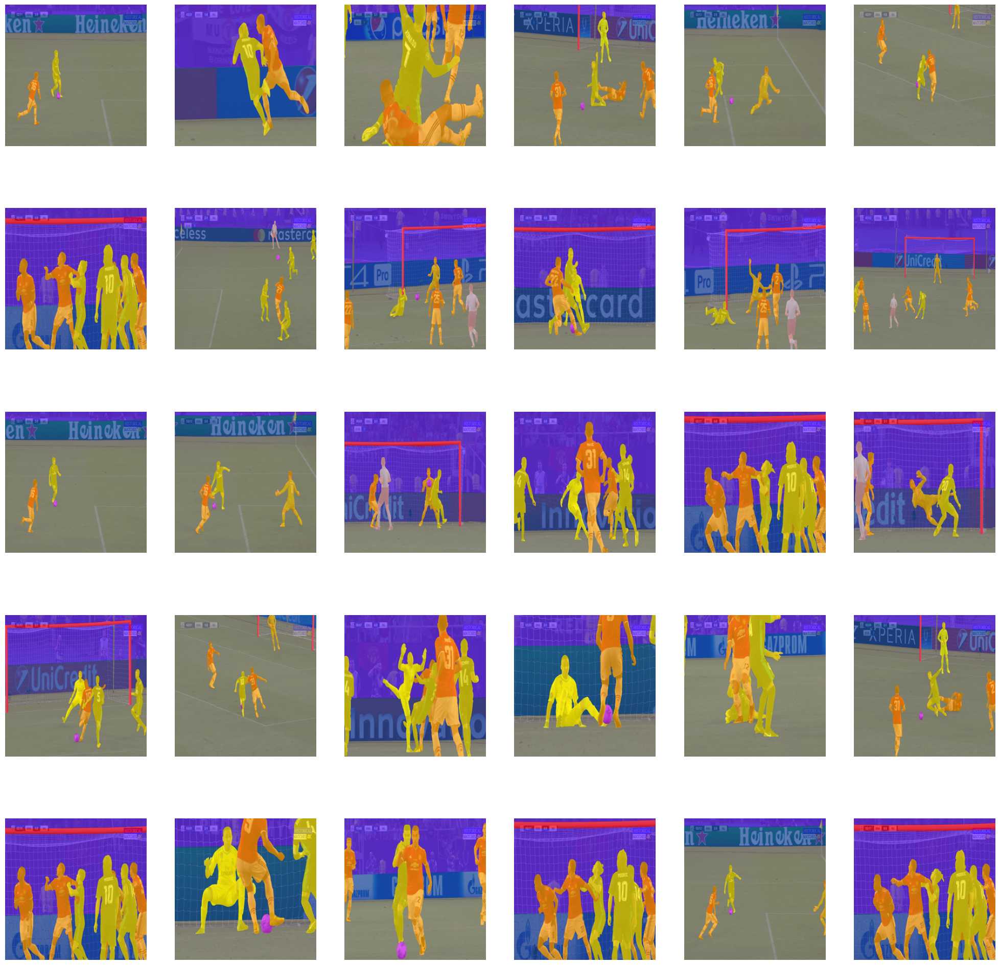

In [ ]:
show_maps(train_images, train_masks)

# Model Selection

## U-Net Architechture¶

In [ ]:

def encoder(X, filters, rate=0.2, pooling=True):
    x = BatchNormalization()(X)
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu',
               kernel_initializer='he_normal')(x)
    x = Dropout(rate)(x)
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu',
               kernel_initializer='he_normal')(x)
    if pooling:
        y = MaxPool2D()(x)
        return x, y
    return x

In [ ]:
def decoder(x, skip_x, filters, rate):
    y = Conv2DTranspose(filters, kernel_size=3, strides=2, padding='same', activation='relu',
                        kernel_initializer='he_normal')(BatchNormalization()(x))
    y = encoder(Concatenate()([y, skip_x]), filters, rate, pooling=False)
    return y

In [ ]:
# Model
from keras.layers import add
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import multiply
from keras.layers import Dropout
from keras.layers import MaxPool2D
from keras.layers import Concatenate
from keras.layers import Conv2DTranspose
from keras.layers import BatchNormalization
from keras.callbacks import Callback, ModelCheckpoint
from keras.models import Model
import glob,cv2

In [ ]:
# Input Layer
InputL = Input(shape=(256, 256, 3), name="InputImage")

# Encoder Block
c1, p1 = encoder(InputL, filters=64, rate=0.1)
c2, p2 = encoder(p1, filters=128, rate=0.1)
c3, p3 = encoder(p2, filters=256, rate=0.2)
c4, p4 = encoder(p3, filters=512, rate=0.2)

# Encoding Layer
encodings = encoder(p4, filters=512, rate=0.3, pooling=False)

# Decoder Block
d = decoder(encodings, c4, filters=512, rate=0.2)
d = decoder(d, c3, filters=256, rate=0.2)
d = decoder(d, c2, filters=128, rate=0.1)
d = decoder(d, c1, filters=64, rate=0.1)

# Output
conv_out = Conv2D(3, kernel_size=3, padding='same', activation='sigmoid', name="Segmentator")(d)

# Model
model = Model(InputL, conv_out, name="UNet")
model.summary()

# Compile Model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

Model: "UNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 InputImage (InputLayer)     [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 3)          12        ['InputImage[0][0]']          
 Normalization)                                                                                   
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['batch_normalization[0][0]'] 
                                                                                                  
 dropout (Dropout)           (None, 256, 256, 64)         0         ['conv2d[0][0]']           

In [ ]:
# Model Visualization
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
import os
import sys
import skimage.io
import matplotlib.pyplot as plt
import cv2
import time
import numpy as np
%matplotlib inline
import tensorflow as tf

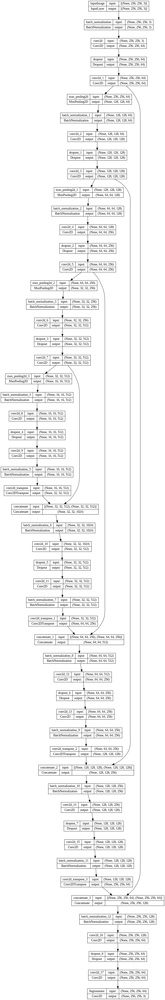

In [ ]:
plot_model(model, "UNet.png", show_shapes=True)

In [ ]:
BATCH_SIZE = 16
SPE = len(images)//BATCH_SIZE

In [ ]:
def show_image(image, title=None):
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [ ]:
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        id = np.random.randint(len(train_images))
        image = train_images[id]
        mask = train_masks[id]
        pred_mask = self.model(tf.expand_dims(image,axis=0))[0]

        plt.figure(figsize=(10,8))
        plt.subplot(1,3,1)
        show_image(image, title="Original Image")

        plt.subplot(1,3,2)
        show_image(mask, title="Original Mask")

        plt.subplot(1,3,3)
        show_image(pred_mask, title="Predicted Mask")

        plt.tight_layout()
        plt.show()

In [ ]:
cbs = [ModelCheckpoint("UNet-Footbal-Player-Segmentation.h5", save_best_only=True),ShowProgress()]

In [ ]:
model.fit(
   train_images,train_masks,
    validation_split=0.1,
    epochs=50,
    batch_size=BATCH_SIZE,
    steps_per_epoch=SPE,
    callbacks=cbs
)

# Model Evalution

In [ ]:
prediction = model.predict(val_images)

In [ ]:
def show_predections(val_images , prediction ,val_masks):

    for i in range(len(val_images)):
        plt.figure(figsize=(10,8))
        plt.subplot(1,3,1)
        show_image(val_images[i], title="Original Image")

        plt.subplot(1,3,2)
        show_image(val_masks[i], title="Original Mask")

        plt.subplot(1,3,3)
        show_image(prediction[i], title="Predicted Mask")

        plt.tight_layout()
        plt.show()

## Visualize model predictions alongside ground truth

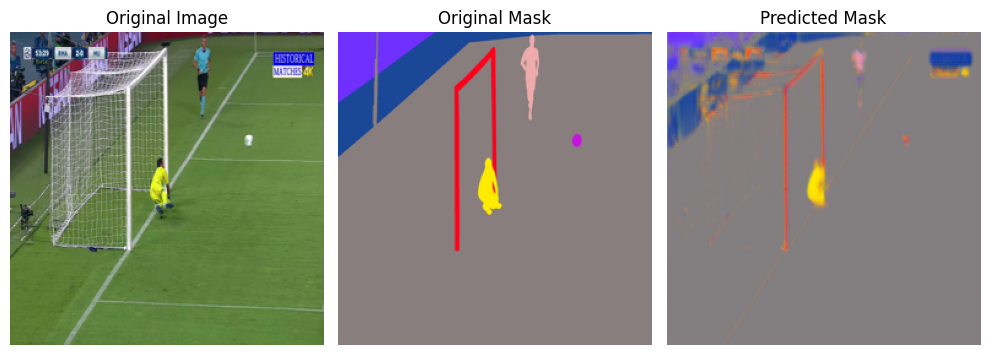

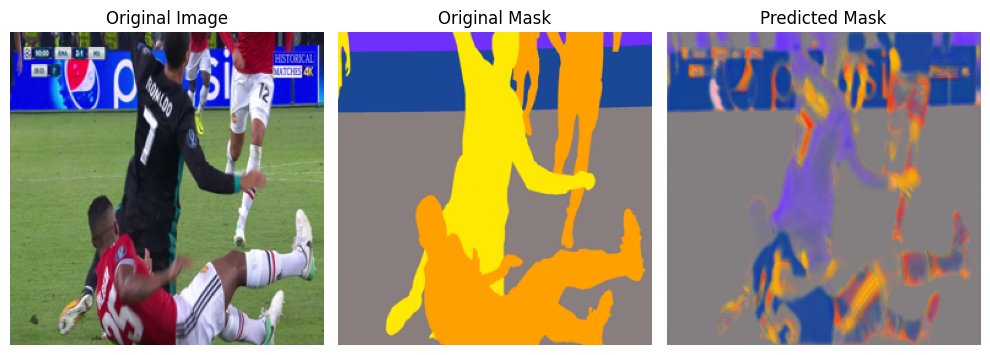

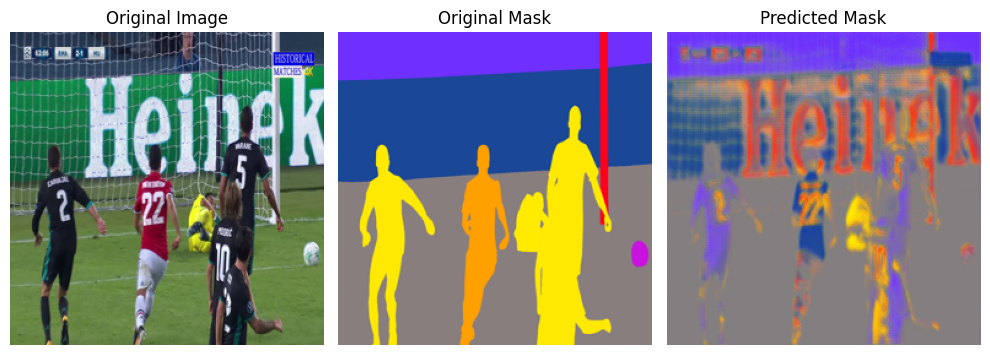

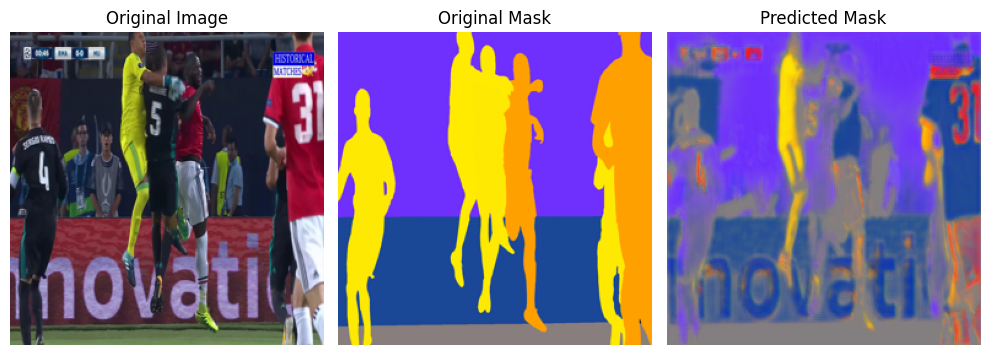

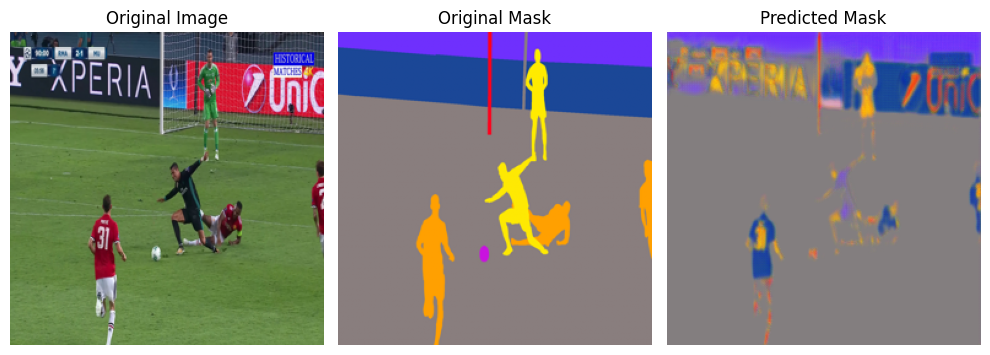

...

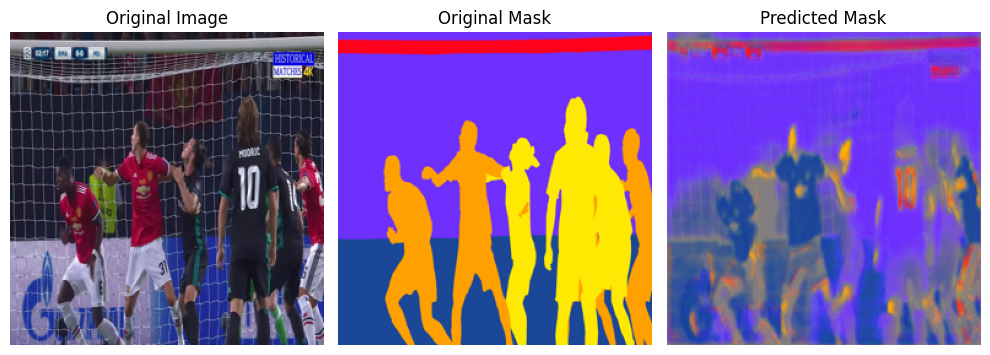

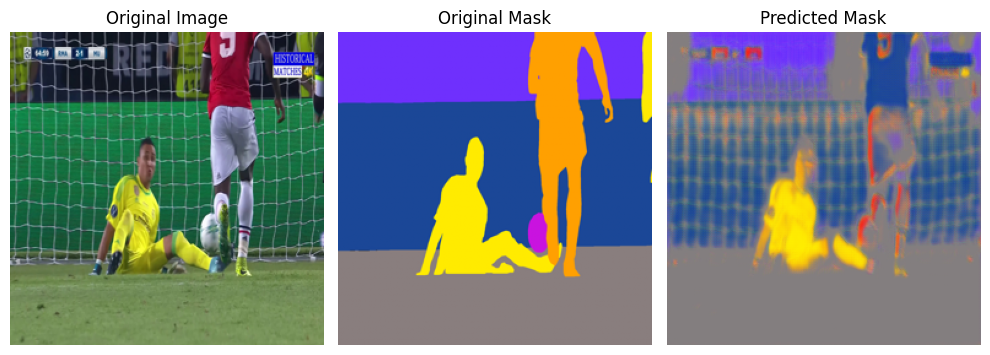

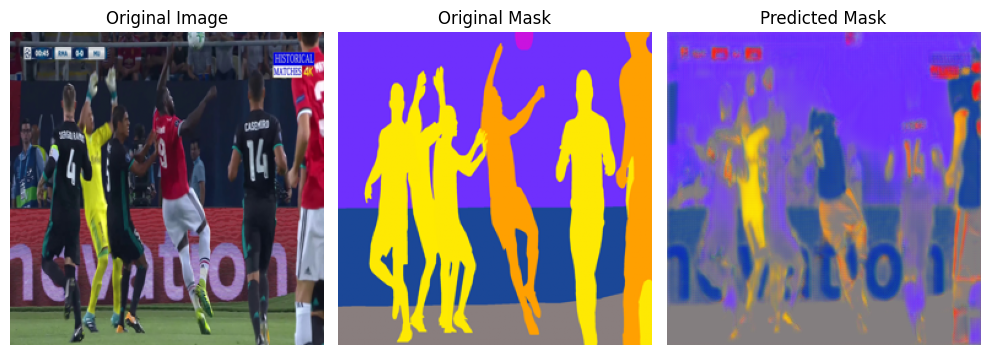

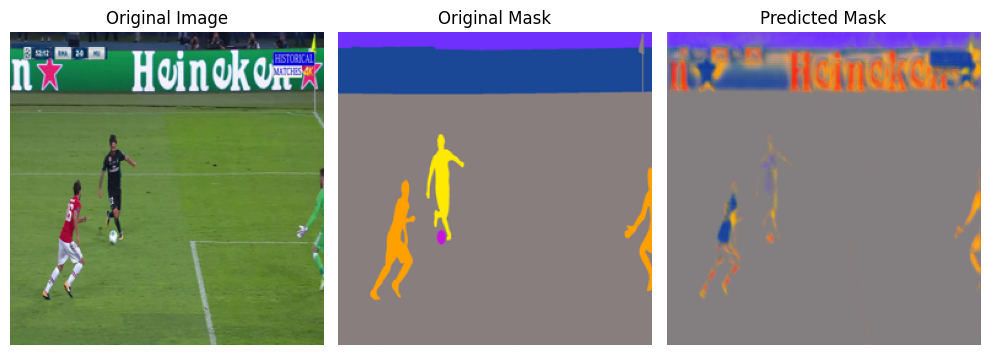

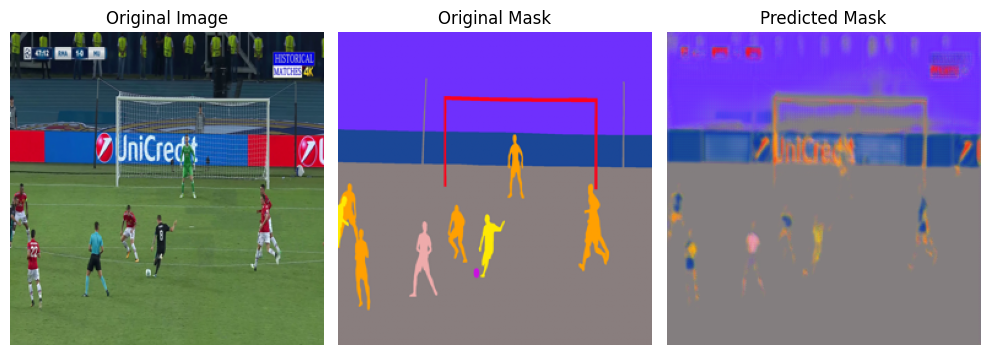

In [ ]:
show_predections(val_images , prediction ,val_masks)

# Saving Model

In [ ]:

# Save the model weights
model.save_weights('semantic_seg.h5')

# Load the model architecture

new_model= Model(InputL, conv_out, name="UNet")
# Load the saved weights
new_model.load_weights('semantic_seg.h5')